# hw04-solution-Xiao Li-223009075

# Question 1

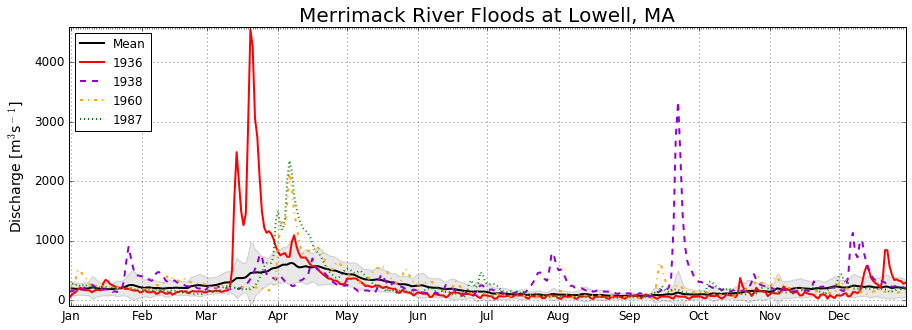

In [1]:
%matplotlib inline
from matplotlib.ticker import MultipleLocator, FormatStrFormatter
import scipy.stats
import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
import datetime as dt
f = open('/Users/lixiao/python4geosciences/data/merrimack_discharge.dat')
f.seek(0)
line = f.readlines()
#generate a dictionary to store the data for each year
y={}
for i in range(1923,2005):
    Y=str(i)
    y[Y]=[]
    for l in line:
        data= l.split('\t')
        if not data: continue
        if len(data)<3: continue
        elif data[2].split('-')[0]==str(i):
            y[Y].append(float(data[3])*0.0283168)
#calculate mean and std
mean=[]
err=[]
for d in range(0,365):
    a=0
    arr=[]
    for i in range(1924,2004):
        a+=y[str(i)][d]
        arr.append(y[str(i)][d])
    mean.append(a/len(range(1924,2004)))
    err.append(np.std(arr))
#calculate mean+std and mean-std
up=np.array(mean)+np.array(err)
below=np.array(mean)-np.array(err)

#Desigh the Plot
fig = plt.figure(figsize=(15,5))
ax1 = fig.add_subplot(111)
date1_1 = dt.datetime(2008, 12, 31)
date1_2 = dt.datetime(2009, 12, 31)
delta1 = dt.timedelta(days=1)
dates1 = mpl.dates.drange(date1_1, date1_2, delta1)
monthsLoc = mpl.dates.MonthLocator()
daysLoc = mpl.dates.DayLocator()
ax1.plot(dates1,mean,color='black',linewidth=2)
ax1.plot(dates1,y['1936'][:-1],color='red',linewidth=2)
ax1.plot(dates1,y['1938'],color='darkviolet',linestyle='--',linewidth=2)
ax1.plot(dates1,y['1960'][:-1],color='orange',linestyle='-.',linewidth=2)
ax1.plot(dates1,y['1987'],':',color='green',linewidth=2)
ax1.fill_between(dates1,up,below,alpha=0.5, edgecolor='darkgrey', facecolor='lightgrey')
ax1.legend(('Mean','1936', '1938', '1960', '1987'), loc=2, numpoints=1)
ax1.set_xlim(dates1[0], dates1[-1])
ax1.set_ylim(-100, 4600)
ax1.grid(True, color='k', linestyle=':', linewidth=0.5)
ax1.xaxis.set_major_locator(monthsLoc)
ax1.xaxis.set_minor_locator(daysLoc)
monthsFmt = mpl.dates.DateFormatter('%b')
ax1.xaxis.set_major_formatter(monthsFmt)
for tick in ax1.xaxis.get_major_ticks():
    tick.label.set_fontsize(12) 
for tick in ax1.yaxis.get_major_ticks():
    tick.label.set_fontsize(12) 
ax1.set_ylabel('Discharge [m$^3$s$^-$$^1$]', fontsize=14)
ax1.set_title('Merrimack River Floods at Lowell, MA', fontsize=20)

# Question 2

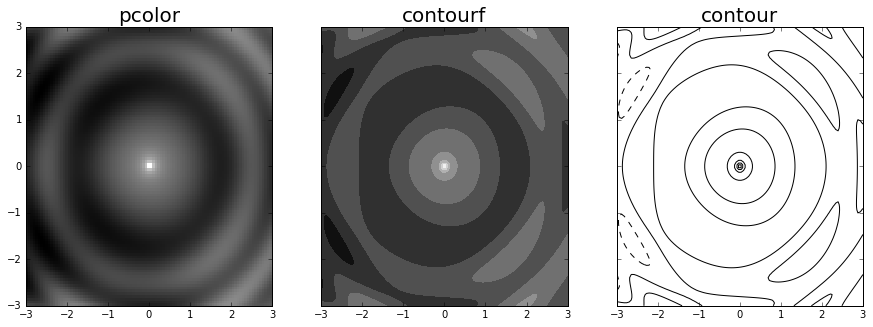

In [2]:
X=np.linspace(-3, 3, 100)
Y=np.linspace(-3, 3, 100)
X, Y = np.meshgrid(X, Y)
Z = np.cos(X**2+Y**2)*(X**2+Y**2)**-0.25 + 0.2*X*Y*np.sin(Y) \
   + 0.01*X*Y**4*np.sin(X) + 0.2*np.exp(-Y**2)
fig, axes = plt.subplots(1, 3, sharey=True,figsize=(15,5))
axes[0].pcolormesh(X, Y, Z, cmap='gray')  # use the gray colormap to look more realistic
axes[0].axis([X.min(), X.max(), Y.min(), Y.max()])
axes[0].set_title('pcolor', fontsize=20)
axes[1].contourf(X, Y, Z, cmap='gray')  # use the gray colormap to look more realistic
axes[1].axis([X.min(), X.max(), Y.min(), Y.max()])
axes[1].set_title('contourf', fontsize=20)
CS=axes[2].contour(X, Y, Z, colors='black')  # use the gray colormap to look more realistic
lines = [CS.collections[0], CS.collections[-1]]
axes[2].set_title('contour', fontsize=20)

# Question 3

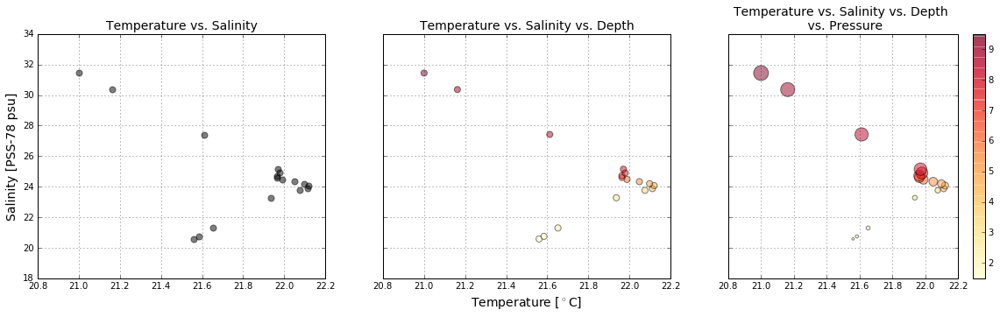

In [13]:
f = open('/Users/lixiao/python4geosciences/data/MCH/m1001a.cnv2')
a=f.readlines()
salt=[]
temp=[]
pres=[]
dep=[]
for line in a[57:]:
    data = line.split()
    if not data: continue
    salt.append(float(data[5]))
    temp.append(float(data[2]))
    pres.append(float(data[0]))
    dep.append(float(data[1]))
fig, axes = plt.subplots(1, 3, sharey=True, figsize=(20, 5))
axes[0].scatter(temp, salt, s=50,c='black', alpha=0.5)
axes[0].set_title('Temperature vs. Salinity', fontsize=14)
axes[0].set_ylabel('Salinity [PSS-78 psu]', fontsize=14)
axes[0].grid(True, color='k', linestyle=':', linewidth=0.5)
axes[1].scatter(temp, salt, s=50, c=dep, cmap='YlOrRd', alpha=0.5)
axes[1].set_title('Temperature vs. Salinity vs. Depth', fontsize=14)
axes[1].set_xlabel('Temperature [$^\circ$C]', fontsize=14)
axes[1].grid(True, color='k', linestyle=':', linewidth=0.5)
mappable=axes[2].scatter(temp, salt, s=(np.pi*np.array(pres)**2), c=dep, cmap='YlOrRd', alpha=0.5)
axes[2].set_title('Temperature vs. Salinity vs. Depth \n vs. Pressure', fontsize=14)
fig.colorbar(mappable)
axes[2].grid(True, color='k', linestyle=':', linewidth=0.5)

# Question 4

(0, 21)

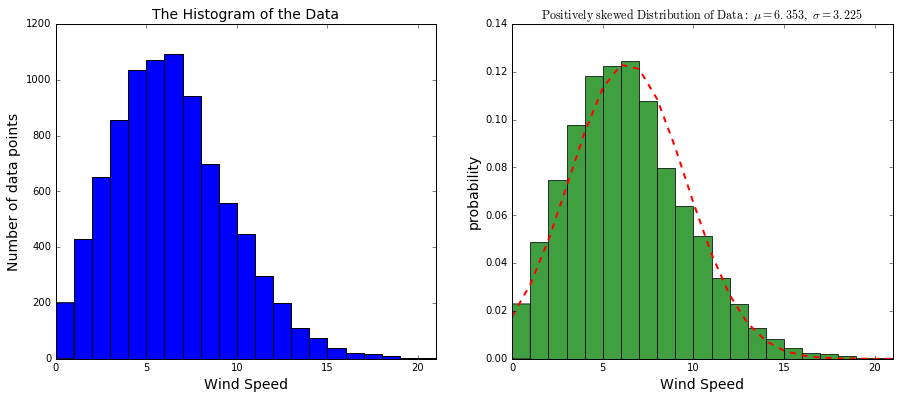

In [14]:
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
from scipy.stats import norm
import matplotlib.mlab as mlab
burl = np.genfromtxt('http://www.ndbc.noaa.gov/view_text_file.php?filename=burl1h2010.txt.gz&dir=data/historical/stdmet/')
wind_speed = burl[:, 6]

fig = plt.figure(figsize=(15,6))
ax1 = fig.add_subplot(1, 2, 1)
ax1.hist(wind_speed, bins=21)
ax1.set_xlabel('Wind Speed',fontsize=14)
ax1.set_ylabel('Number of data points',fontsize=14)
ax1.set_title('The Histogram of the Data', fontsize=14)
ax1.set_xlim(0, 21)

ax2 = fig.add_subplot(1, 2, 2)

(mu, sigma) = norm.fit(wind_speed)
# the histogram of the data
n, bins, patches = ax2.hist(wind_speed, 21,  normed=1, facecolor='green', alpha=0.75)
# add a 'best fit' line
y = mlab.normpdf( bins, mu, sigma)
ax2.plot(bins, y, 'r--', linewidth=2)
ax2.set_xlabel('Wind Speed',fontsize=14)
ax2.set_ylabel('probability',fontsize=14)
ax2.set_title(r'$\mathrm{Positively\ skewed\ Distribution\ of\ Data:}\ \mu=%.3f,\ \sigma=%.3f$' %(mu, sigma))
ax2.set_xlim(0, 21)

# Question 5

# Solution 1 : Just use year as a variable

Predicting CO2 in the year 2100: 
Using 1st Order: 522.531035709
Using 2nd Order: 676.004063464
Using 5th Order: 142.005856037
I prefer to choose the 2nd Order method
Becasue, the data shows that the co2 continuously increases. 
And Curve 2 looks more fit with the data 


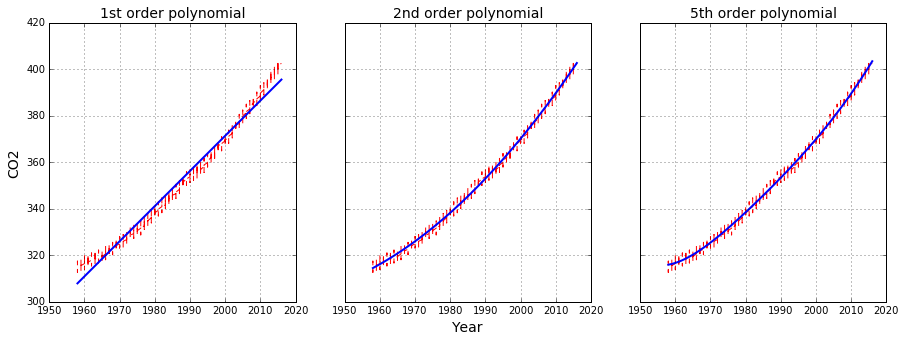

In [31]:
from matplotlib.pyplot import *
mauna_loa_co2 = np.genfromtxt('ftp://aftp.cmdl.noaa.gov/products/trends/co2/co2_mm_mlo.txt')
years = mauna_loa_co2[:, 0]
months = mauna_loa_co2[:, 1]
co2 = mauna_loa_co2[:, 4]
fig, axes = plt.subplots(1, 3, sharey=True,figsize=(15,5))

axes[0].plot(years,co2,'r--', linewidth=1)
coefficients = np.polyfit(years,co2, 1)
polynomial = np.poly1d(coefficients)
ys = polynomial(years)
axes[0].plot(years, ys, linewidth=2)
axes[0].set_title('1st order polynomial', fontsize=14)
axes[0].set_ylabel('CO2', fontsize=14)
axes[0].grid(True, color='k', linestyle=':', linewidth=0.5)

axes[1].plot(years,co2,'r--', linewidth=1)
coefficients2 = np.polyfit(years,co2, 2)
polynomial2 = np.poly1d(coefficients2)
ys2 = polynomial2(years)
axes[1].plot(years, ys2, linewidth=2)
axes[1].set_title('2nd order polynomial', fontsize=14)
axes[1].set_xlabel('Year', fontsize=14)
axes[1].grid(True, color='k', linestyle=':', linewidth=0.5)

axes[2].plot(years,co2,'r--', linewidth=1)
coefficients5 = np.polyfit(years,co2, 5)
polynomial5 = np.poly1d(coefficients5)
ys3 = polynomial5(years)
axes[2].plot(years, ys3, linewidth=2)
axes[2].set_title('5th order polynomial', fontsize=14)
axes[2].grid(True, color='k', linestyle=':', linewidth=0.5)

print('Predicting CO2 in the year 2100: \nUsing 1st Order: '+str(polynomial(2100))+'\nUsing 2nd Order: ' \
      + str(polynomial2(2100))+'\nUsing 5th Order: '+str(polynomial5(2100))+'\nI prefer to choose the 2nd Order method'\
     +'\nBecasue, the data shows that the co2 continuously increases. \nAnd Curve 2 looks more fit with the data ')


# Solution 2 : Using datatime to combine year and month

Predicting CO2 in the Jan 1st,2100: 
Using 1st Order: 521.658728432
Using 2nd Order: 673.681454916
Using 5th Order: -584.824201649
I prefer to choose the 2nd Order method
Becasue, the data shows that the co2 continuously increases.
And Curve 2 looks more fit with the data 


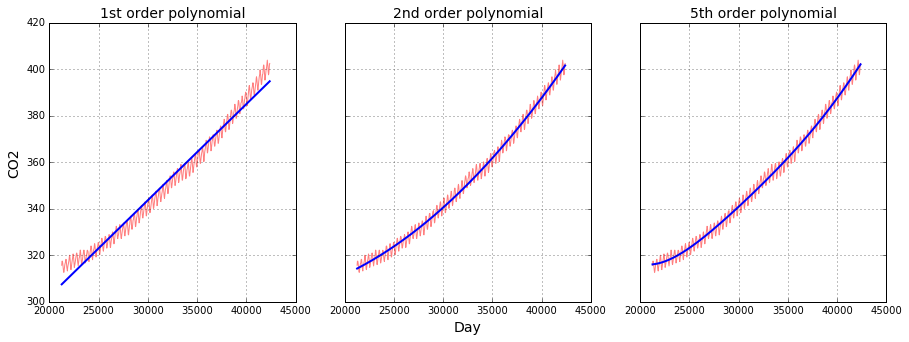

In [30]:
from datetime import datetime, timedelta
dates = [datetime(int(year), int(month), 15) for month, year in zip(months, years)]
to = datetime(1900, 1, 1)
days = [(date-to).days for date in dates]

fig, axes = plt.subplots(1, 3, sharey=True,figsize=(15,5))

axes[0].plot(days,co2,'r-', linewidth=1, alpha=0.5)
coefficients = np.polyfit(days,co2, 1)
polynomial = np.poly1d(coefficients)
ys = polynomial(days)
axes[0].plot(days, ys, linewidth=2)
axes[0].set_title('1st order polynomial', fontsize=14)
axes[0].set_ylabel('CO2', fontsize=14)
axes[0].grid(True, color='k', linestyle=':', linewidth=0.5)

axes[1].plot(days,co2,'-', linewidth=1,color='red', alpha=0.5)
coefficients2 = np.polyfit(days,co2, 2)
polynomial2 = np.poly1d(coefficients2)
ys2 = polynomial2(days)
axes[1].plot(days, ys2, linewidth=2)
axes[1].set_title('2nd order polynomial', fontsize=14)
axes[1].set_xlabel('Day', fontsize=14)
axes[1].grid(True, color='k', linestyle=':', linewidth=0.5)

axes[2].plot(days,co2,'r-', linewidth=1, alpha=0.5)
coefficients5 = np.polyfit(days,co2, 5)
polynomial5 = np.poly1d(coefficients5)
ys3 = polynomial5(days)
axes[2].plot(days, ys3, linewidth=2)
axes[2].set_title('5th order polynomial', fontsize=14)
axes[2].grid(True, color='k', linestyle=':', linewidth=0.5)

st = datetime(2100, 1, 1)
to = datetime(1900, 1, 1)
dd=(st-to).days
print('Predicting CO2 in the Jan 1st,2100: \nUsing 1st Order: '+str(polynomial(dd))+'\nUsing 2nd Order: ' \
      + str(polynomial2(dd))+'\nUsing 5th Order: '+str(polynomial5(dd))+ \
      '\nI prefer to choose the 2nd Order method'\
     +'\nBecasue, the data shows that the co2 continuously increases.'\
      +'\nAnd Curve 2 looks more fit with the data ')

# Question 6

/Users/lixiao/anaconda/lib/python3.5/site-packages/matplotlib/pyplot.py:516: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


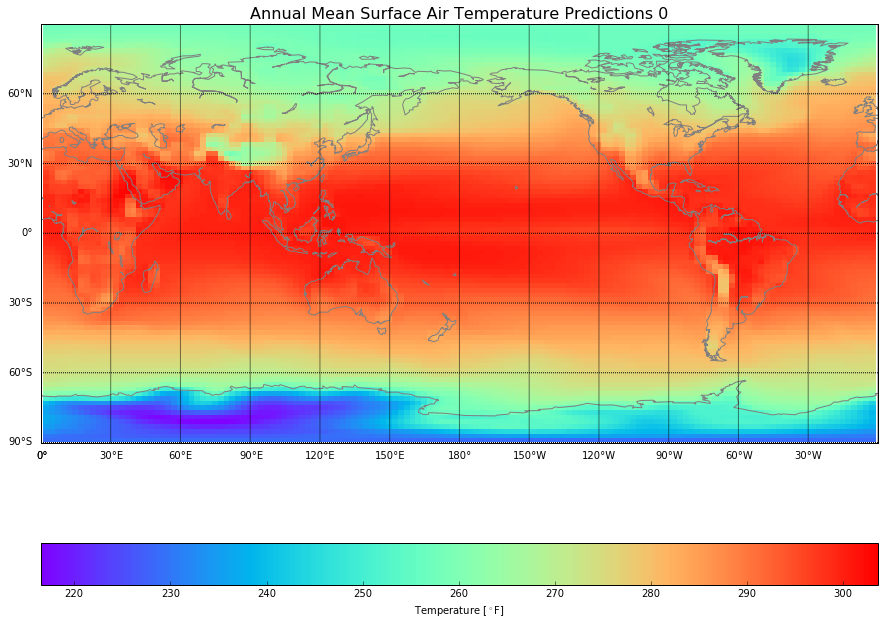

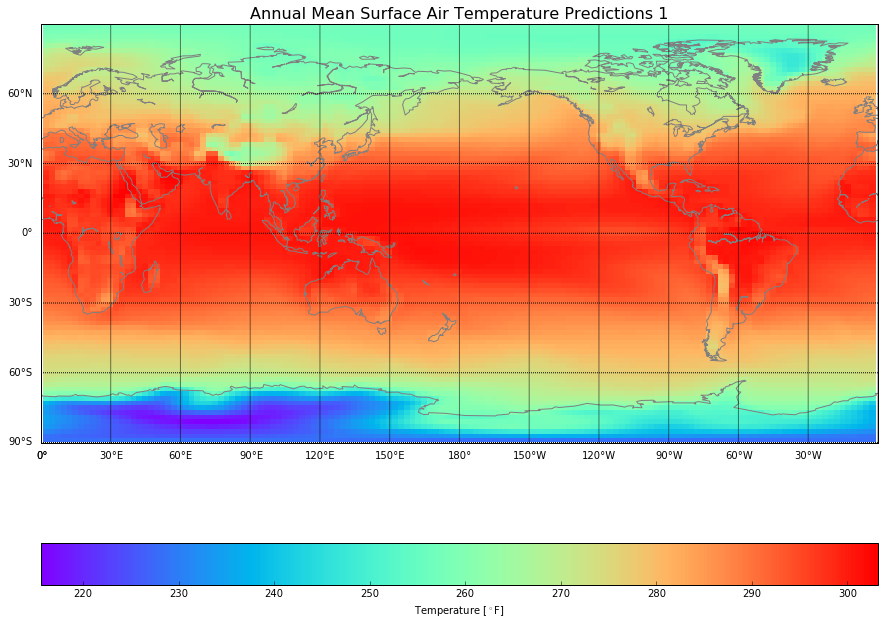

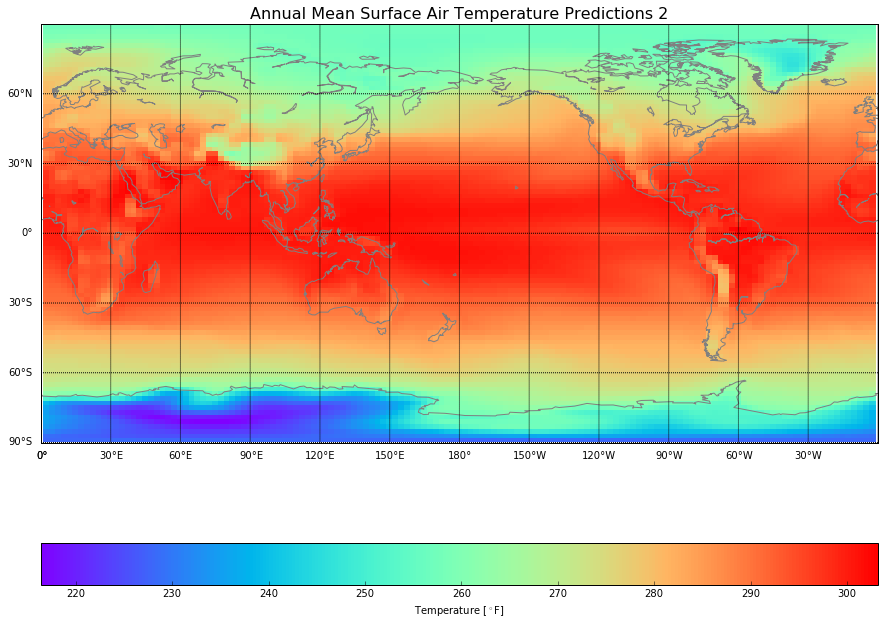

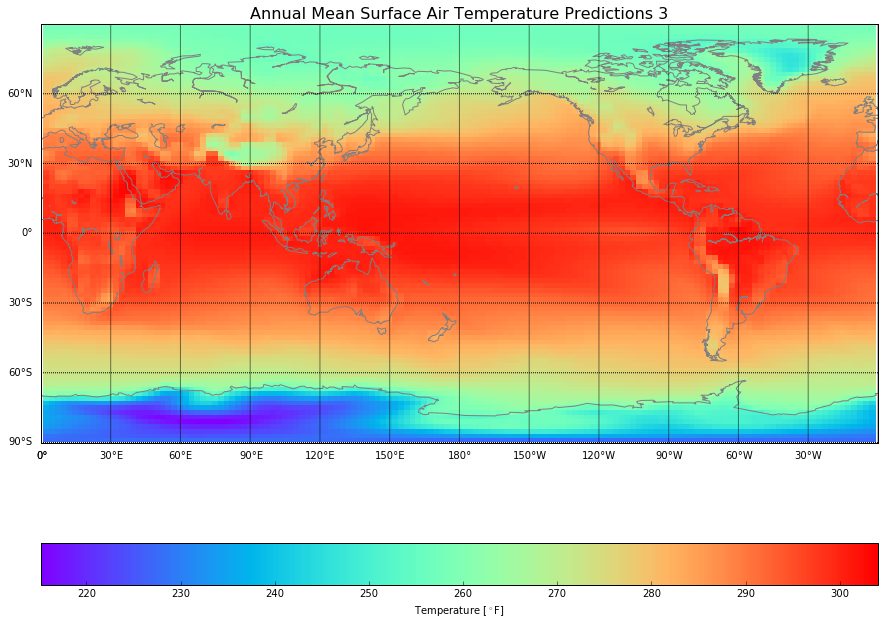

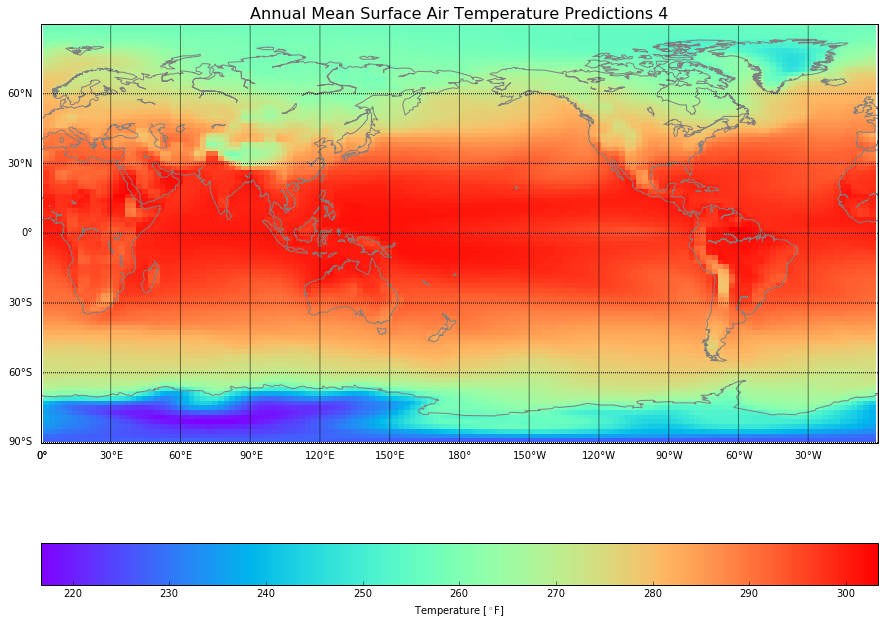

...

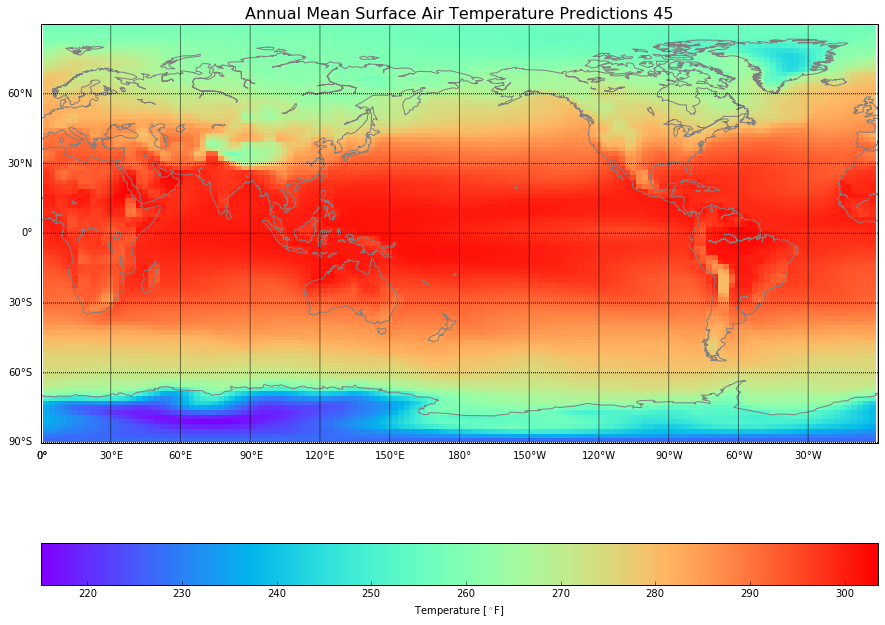

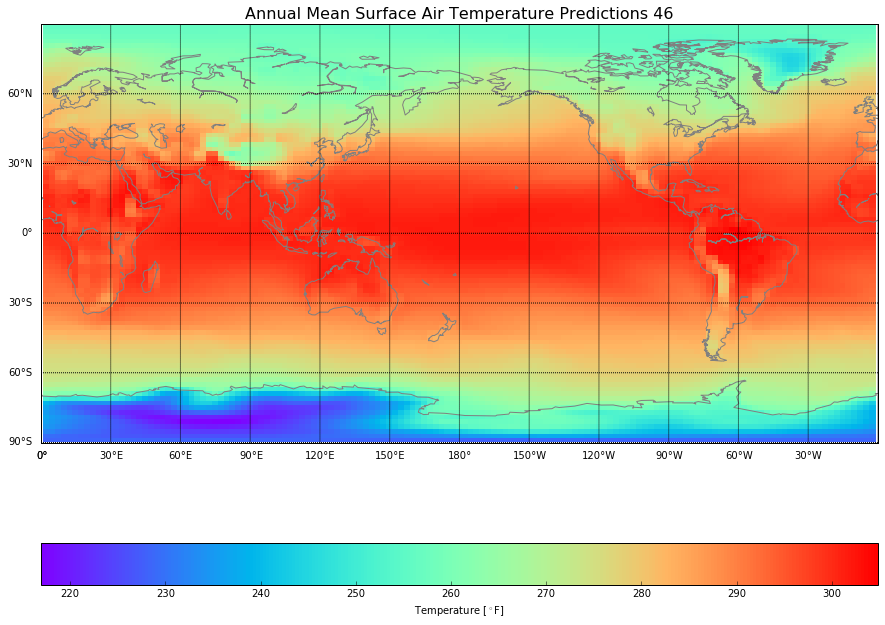

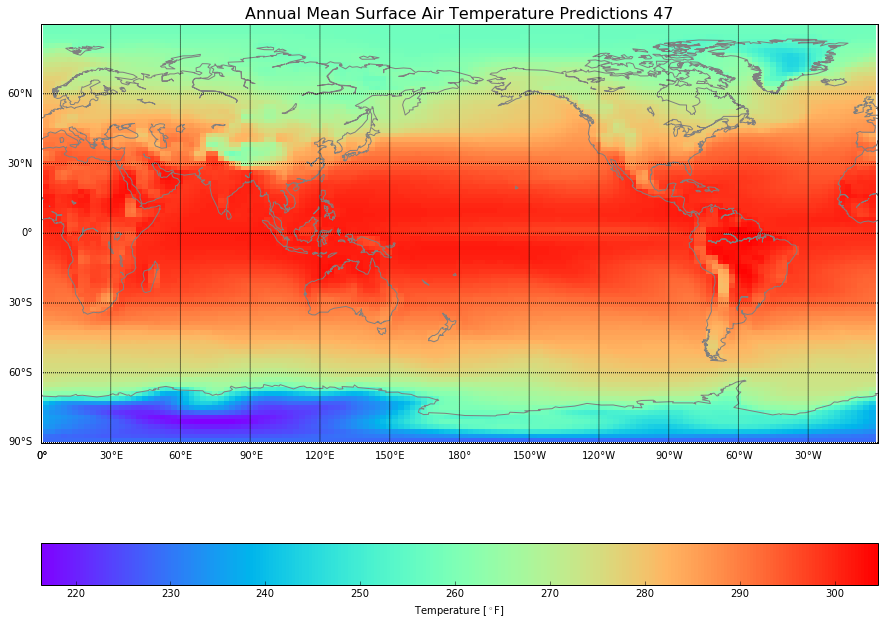

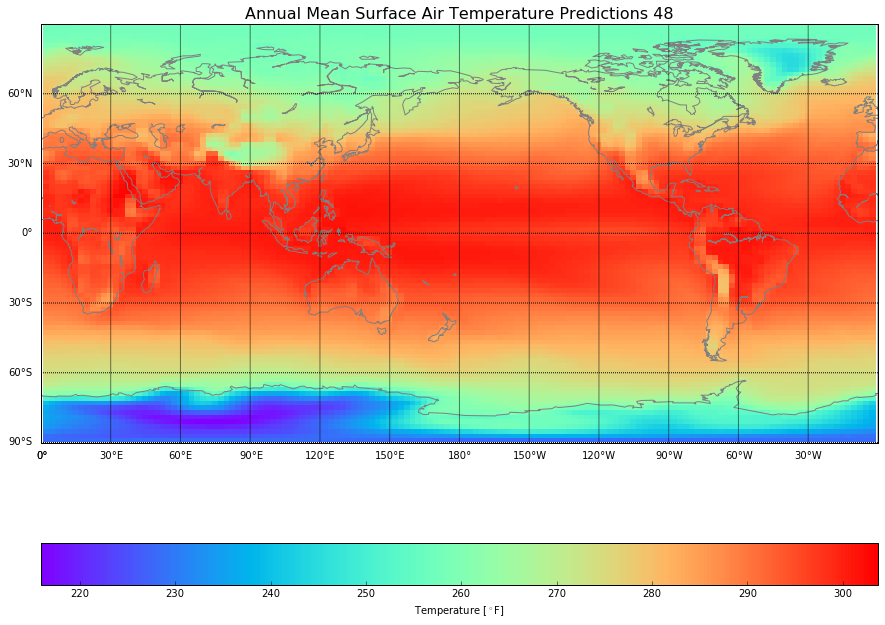

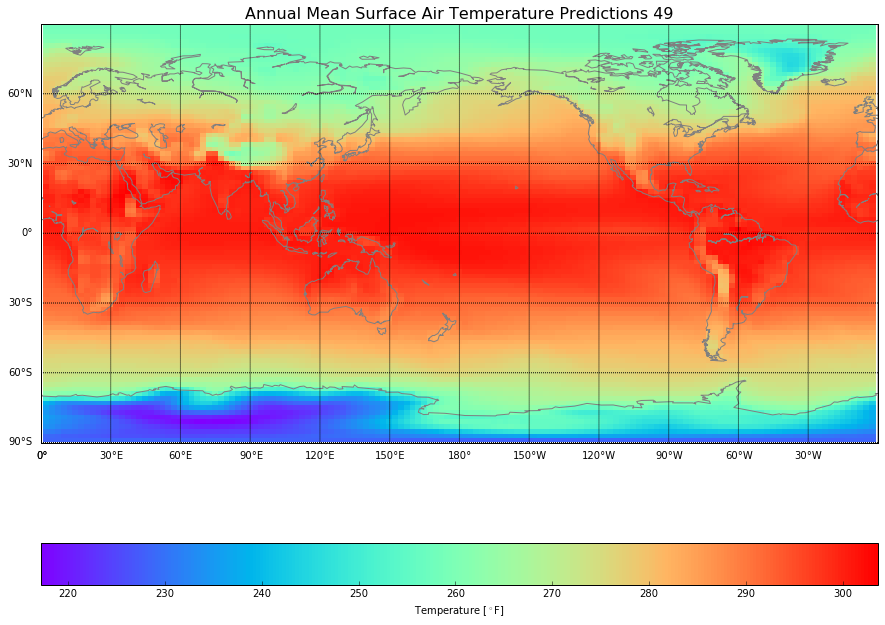

TypeError: First argument must be a path or file object reading bytes

TypeError: First argument must be a path or file object reading bytes

TypeError: First argument must be a path or file object reading bytes

TypeError: First argument must be a path or file object reading bytes

TypeError: First argument must be a path or file object reading bytes

TypeError: First argument must be a path or file object reading bytes

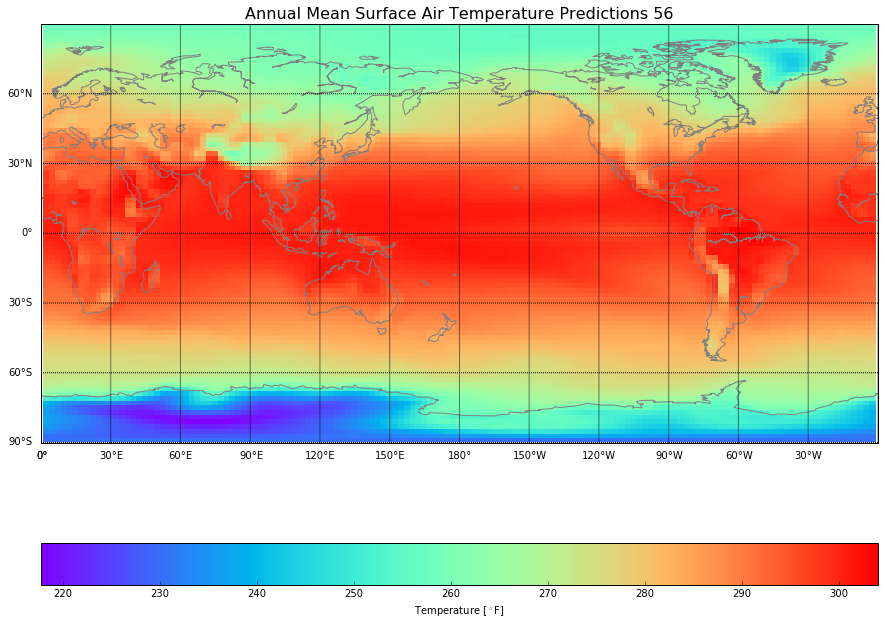

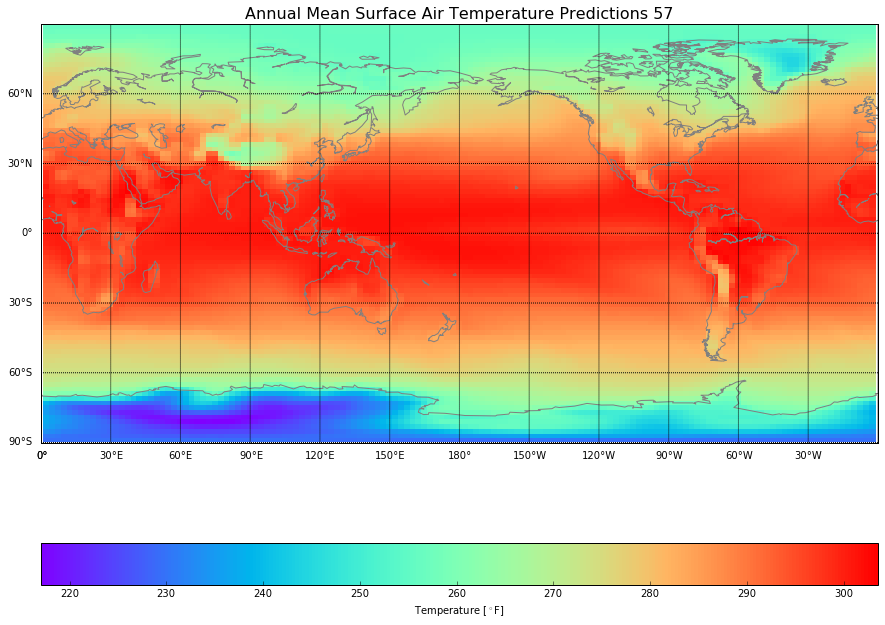

TypeError: First argument must be a path or file object reading bytes

TypeError: First argument must be a path or file object reading bytes

TypeError: First argument must be a path or file object reading bytes

TypeError: First argument must be a path or file object reading bytes

TypeError: First argument must be a path or file object reading bytes

TypeError: First argument must be a path or file object reading bytes

TypeError: First argument must be a path or file object reading bytes

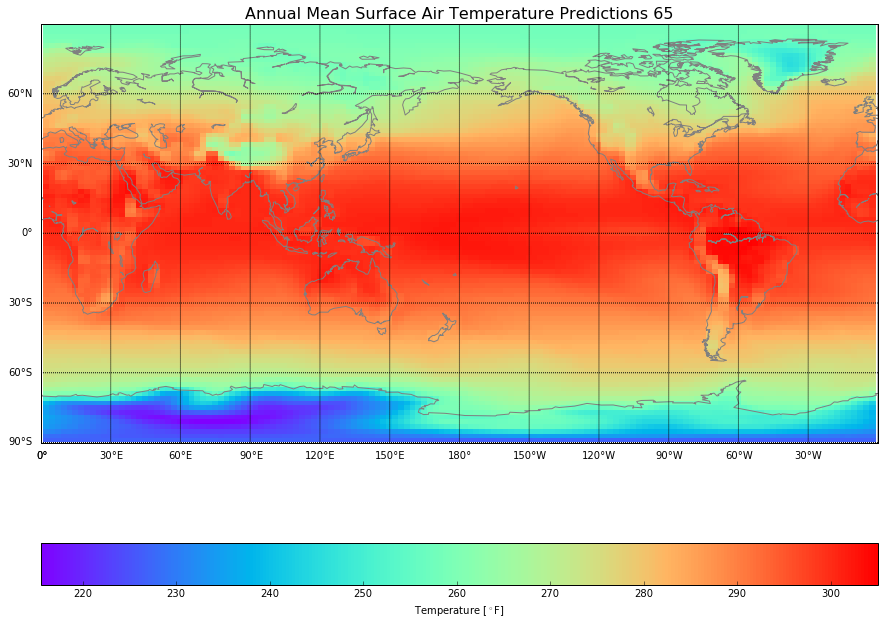

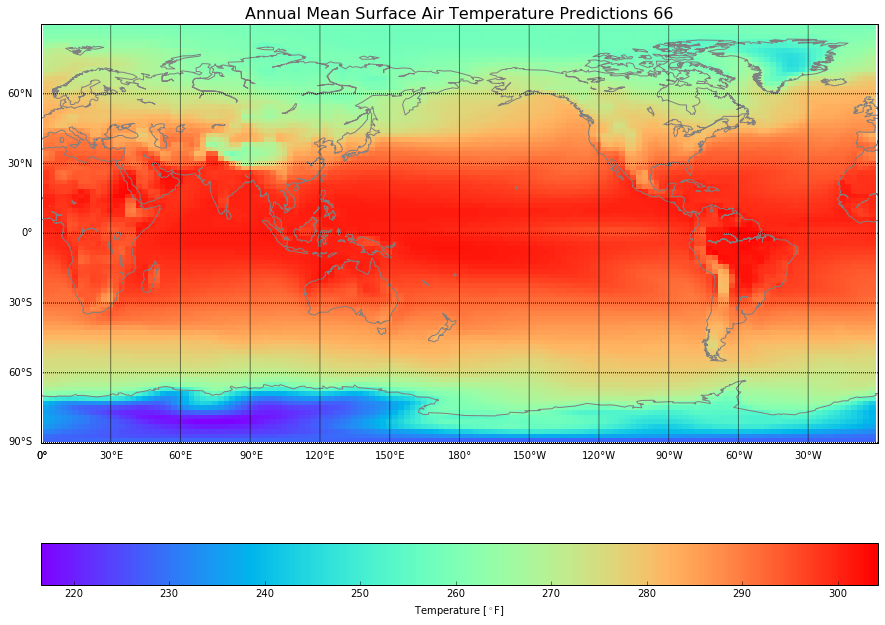

TypeError: First argument must be a path or file object reading bytes

TypeError: First argument must be a path or file object reading bytes

TypeError: First argument must be a path or file object reading bytes

TypeError: First argument must be a path or file object reading bytes

TypeError: First argument must be a path or file object reading bytes

TypeError: First argument must be a path or file object reading bytes

TypeError: First argument must be a path or file object reading bytes

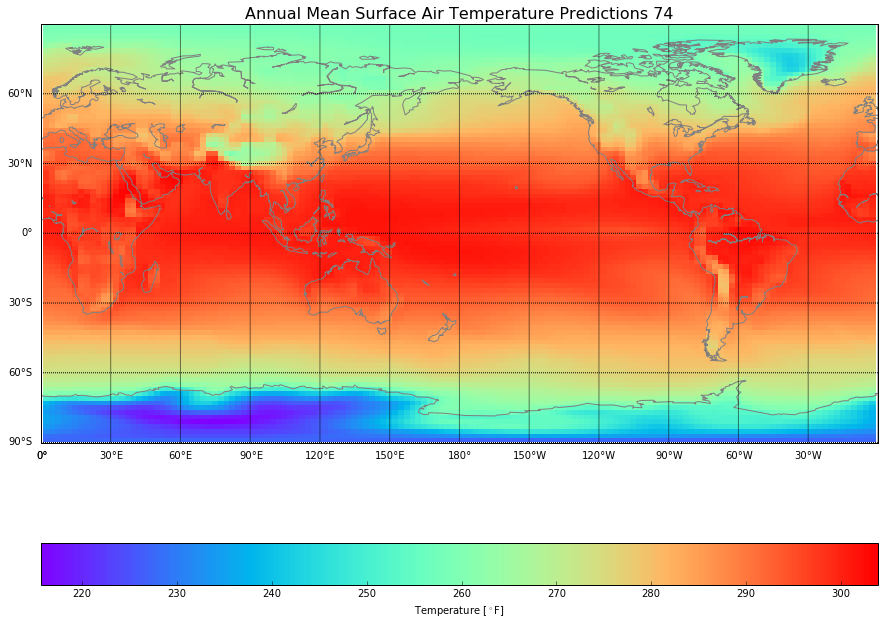

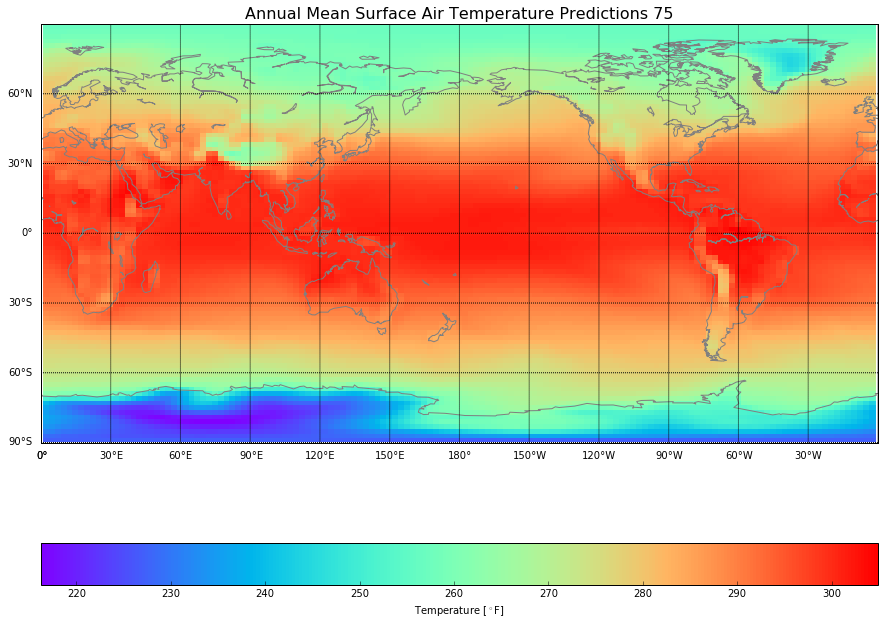

TypeError: First argument must be a path or file object reading bytes

TypeError: First argument must be a path or file object reading bytes

TypeError: First argument must be a path or file object reading bytes

TypeError: First argument must be a path or file object reading bytes

TypeError: First argument must be a path or file object reading bytes

TypeError: First argument must be a path or file object reading bytes

TypeError: First argument must be a path or file object reading bytes

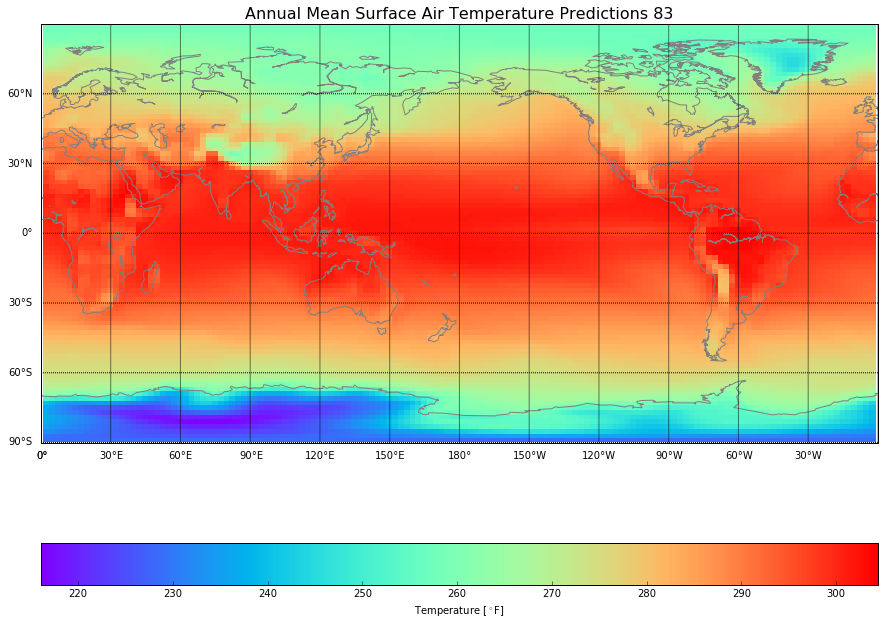

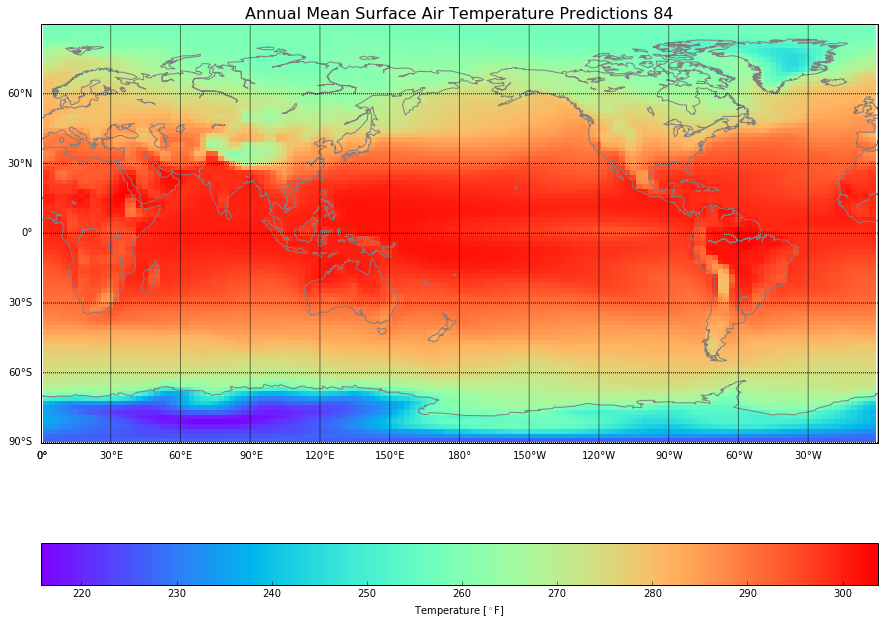

TypeError: First argument must be a path or file object reading bytes

TypeError: First argument must be a path or file object reading bytes

TypeError: First argument must be a path or file object reading bytes

TypeError: First argument must be a path or file object reading bytes

TypeError: First argument must be a path or file object reading bytes

TypeError: First argument must be a path or file object reading bytes

TypeError: First argument must be a path or file object reading bytes

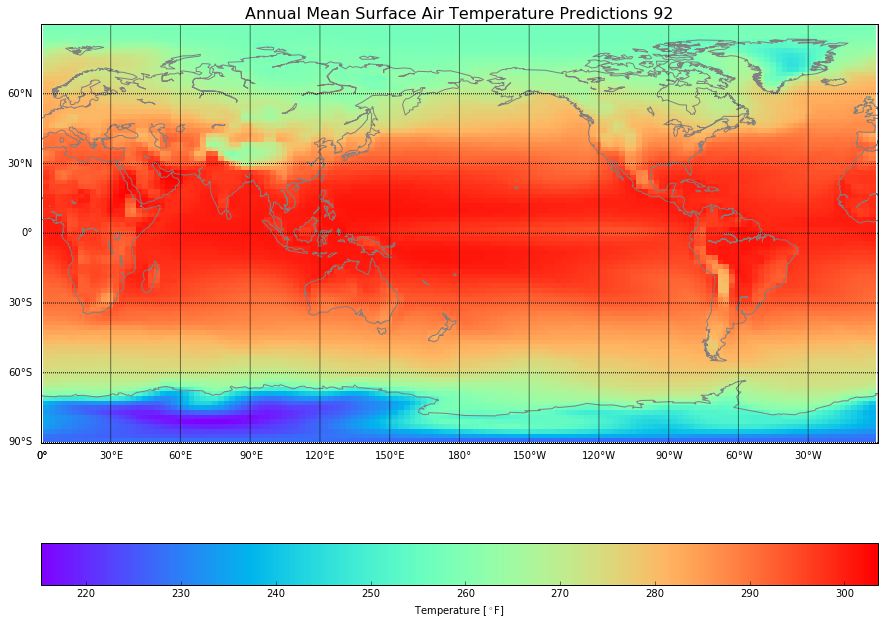

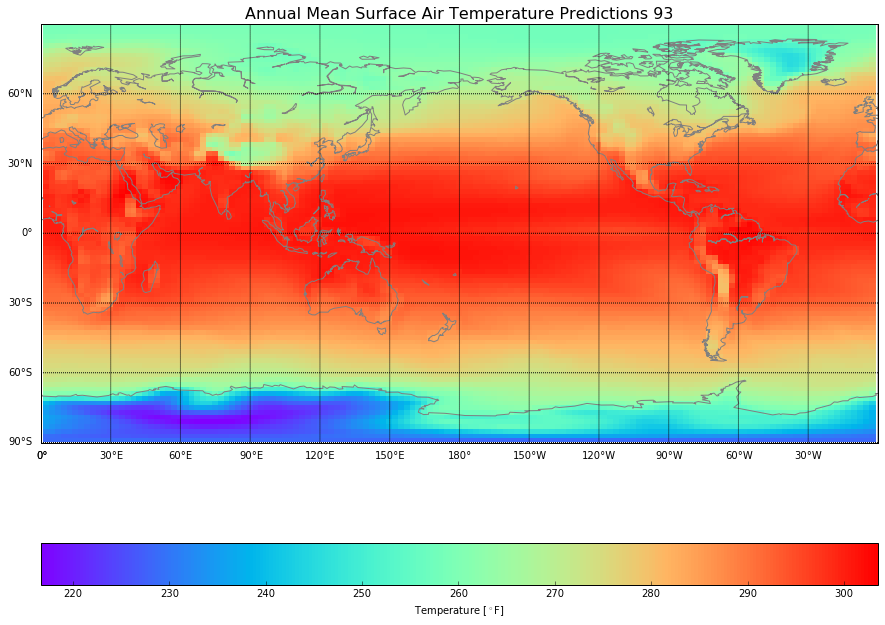

TypeError: First argument must be a path or file object reading bytes

TypeError: First argument must be a path or file object reading bytes

TypeError: First argument must be a path or file object reading bytes

TypeError: First argument must be a path or file object reading bytes

TypeError: First argument must be a path or file object reading bytes

TypeError: First argument must be a path or file object reading bytes

In [33]:
from mpl_toolkits.basemap import Basemap
lon, lat, sst = np.load('/Users/lixiao/python4geosciences/data/surface_temp_predictions.npz', encoding='latin1')['arr_0']
for i in range(0,100):
    fig = plt.figure(figsize=(15,12))
    ax = fig.add_subplot(111)
    m = Basemap(projection = 'cyl',llcrnrlon=0,urcrnrlon=360,llcrnrlat=-90,urcrnrlat=90,resolution='c')
    m.drawcoastlines(color='grey')
    X, Y = (np.meshgrid(lon, lat))
    bar=ax.pcolormesh(X, Y, sst[i], cmap='rainbow')
    cb=plt.colorbar(bar,orientation='horizontal')
    ax.set_title('Annual Mean Surface Air Temperature Predictions '+str(i),fontsize=16)
    m.drawmeridians(np.arange(0,360,30),labels=[False, False, False, True])
    m.drawparallels(np.arange(-90,90,30),labels=[True, False, False, False])
    cb.set_label('Temperature [$^\circ$F]')
    plt.savefig('temperature_%06d.png' % i)